In [1]:
import os
import os.path as op
import json
import cv2
import numpy as np
from tqdm import tqdm

import numpy as np
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw

In [29]:
orig_root = '../../../../datasets/coco_caption'
img_root = '/media/stopmosk/data/coco_2014/images'
gen_root = '../../../../output'
gen_filename = 'pred.coco_caption.val.beam1.max20.odlabels_coco_format.json'
gen_filename2 = 'pred.coco_caption.test.beam5.max20.odlabels_coco_format.json'
gen_filename3 = 'vocab.txt'

# gen_fullpath = op.join(gen_root, 'scst', 'checkpoint-22-628000', gen_filename)
# gen_fullpath = op.join(gen_root, 'txtcps_xe_clro_posenc_roz_pos_xywh', 'checkpoint-79-182960', gen_filename3)
gen_fullpath = op.join(gen_root, 'tzz', gen_filename2)
gen_fullpath

'../../../../output/tzz/pred.coco_caption.test.beam5.max20.odlabels_coco_format.json'

In [37]:
with open(gen_fullpath) as fp:
    res_json = json.load(fp)

res_dict = {int(s['image_id']): s['caption'] for s in res_json}
res_dict[391895]
# res_dict

'a dirt field has a number of 55 on it.'


GENERATED CAP: a dirt field has a number of 55 on it.

GENERATED CAP: a table full of food with a label that says'scratching'on it

GENERATED CAP: a large piece of machinery has the numbers 666 on it.

GENERATED CAP: a kitchen with a sign on the wall that says " demo. "

GENERATED CAP: a bunch of wooden planks with the number 5 in the center.

GENERATED CAP: a bunch of wooden boards with the number 5 in the middle.

GENERATED CAP: two sinks with the words'all purpose'on the bottom of them

GENERATED CAP: a bunch of vehicles on a field with the number 5 on it.

GENERATED CAP: a bathroom with a sign on the wall that says'no smoking '

GENERATED CAP: a bathroom with a sign on the wall that says'no smoking '

GENERATED CAP: an old black and white photo of a person with the words hooning on the bottom of

GENERATED CAP: a vintage black and white photo of a lot of vehicles with a sign that reads " ho

GENERATED CAP: a bunch of products are on display in a lot with a sign that says barbecue.

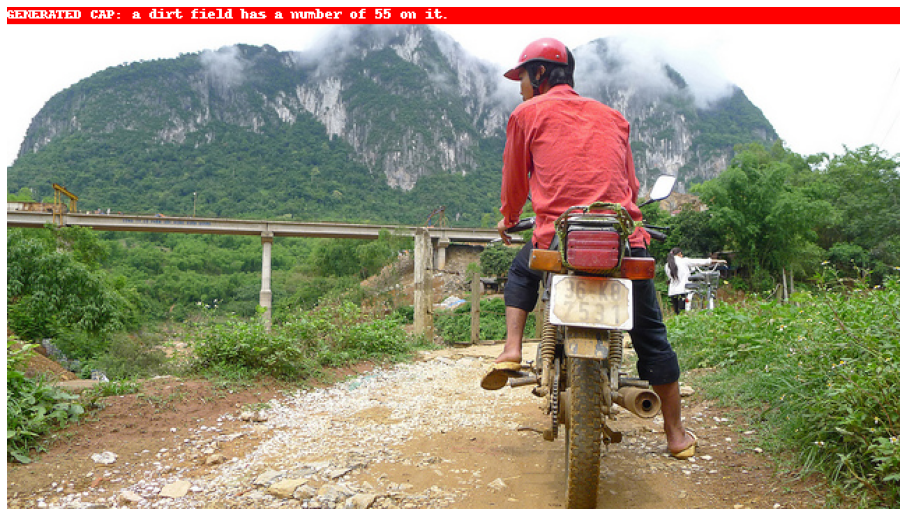

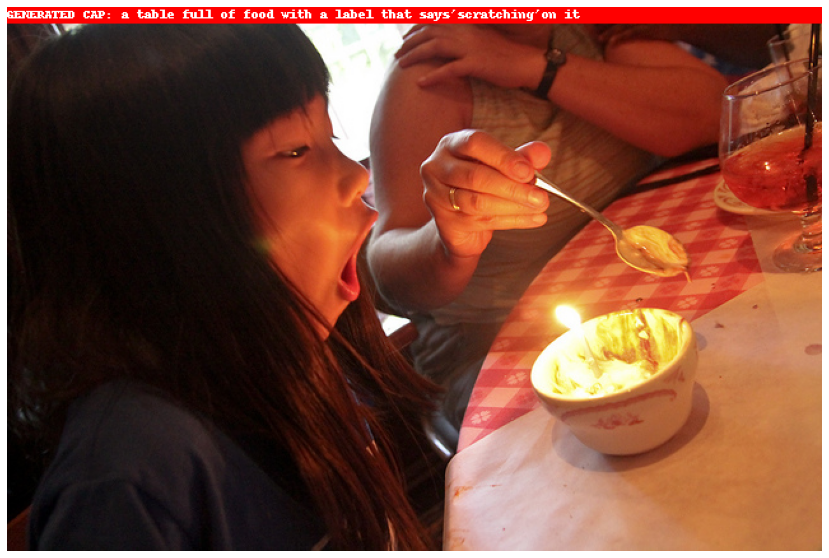

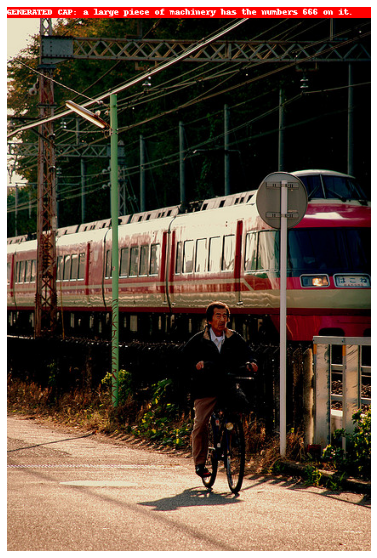

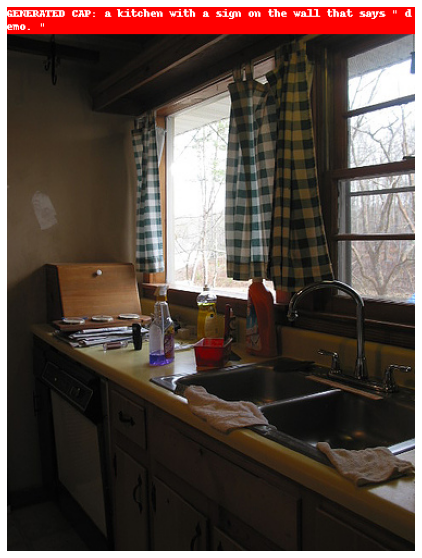

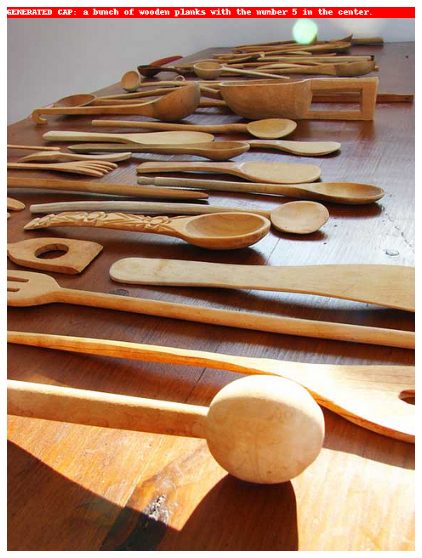

...

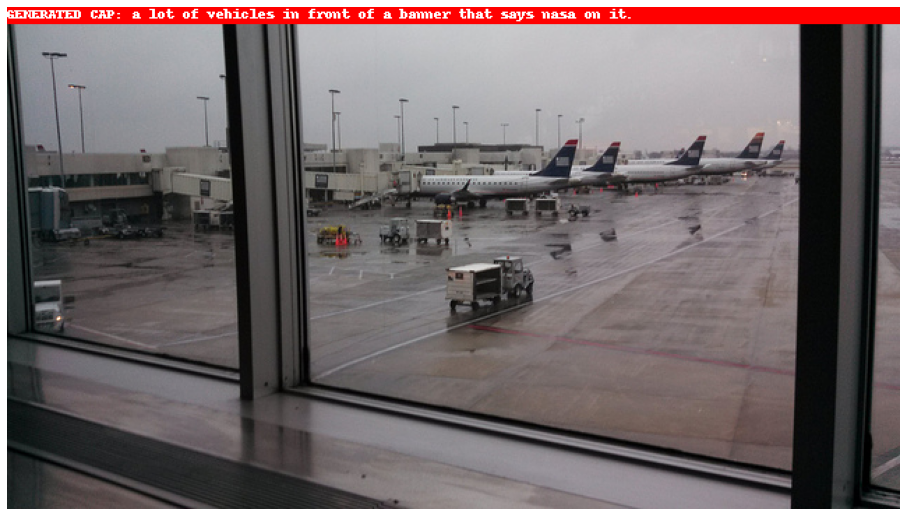

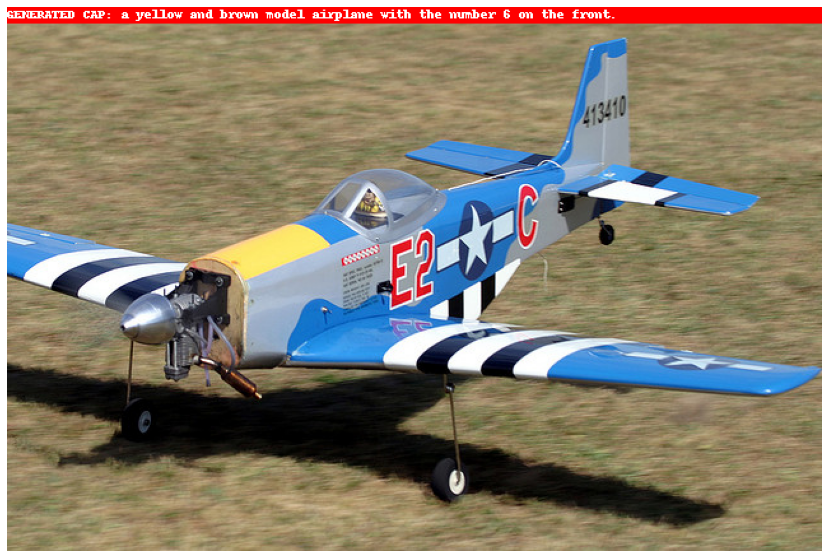

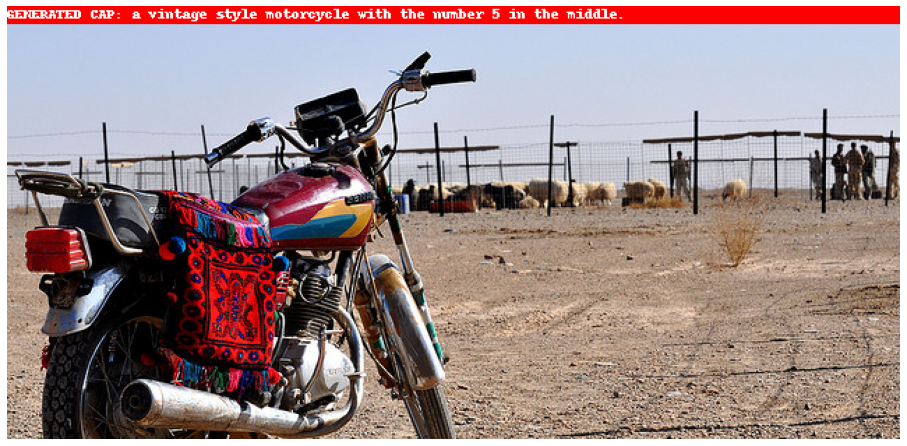

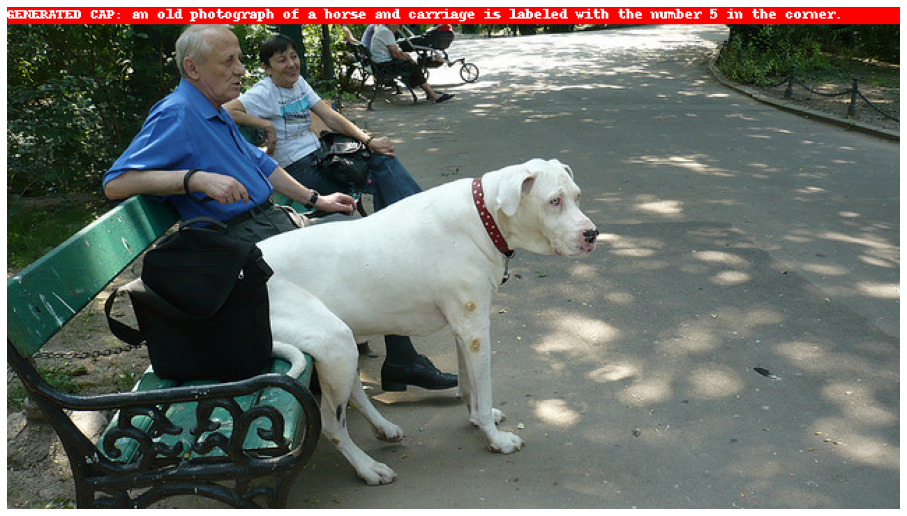

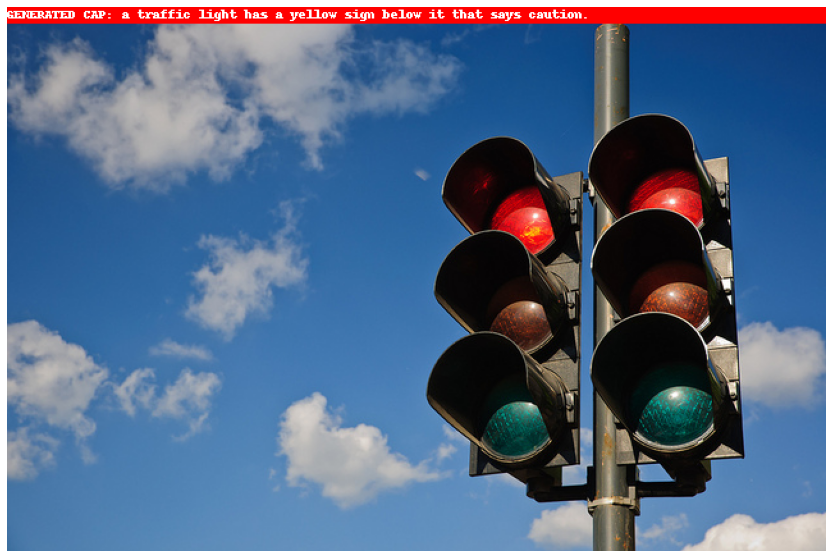

In [44]:
def show_res(sample_idx):
    im_filename = 'COCO_val2014_' + '0' * (12 - len(str(sample_idx))) + str(sample_idx) + '.jpg'
    im_fullpath = os.path.join(img_root, 'val2014', im_filename)
    im = Image.open(im_fullpath)
    # im = im.resize((im.width//2, im.height//2))

    plt.figure(figsize=(16,10))
    draw = ImageDraw.Draw(im)

    text_cap = f"GENERATED CAP: {res_dict[sample_idx]}"
    print('\n' + text_cap)

    max_str_len = im.width // 6  # max string length in letters
    strings_num = len(text_cap) // max_str_len + 1

    b_text = [0, 0, im.width, 12 * strings_num]
    draw.rectangle(b_text, fill=255)

    text_cap_chunks = [text_cap[seek: seek + max_str_len] for seek in range(0, len(text_cap), max_str_len)]
    for i, chunk in enumerate(text_cap_chunks):
        draw.text((0, i * 12), chunk, stroke_width=40, stroke_fill=255)

    plt.axis('off')

    plt.imshow(im);
    plt.savefig('coco_out/' + str(sample_idx) + '.png', bbox_inches='tight')

sample_idx = 34

for sample_idx in list(res_dict.keys())[:20]:
    show_res(sample_idx)